# SLA test case 

This file is divided into three parts:

Part I: Path, repo, docker images, and environment file creation: you must do this inside the docker-dev enviornment.

Part II: Starting a fabric smart client network: you can do inside or outside the dev-env.

Part III: Interaction with the network using CLI: you can do it inside or outside the dev-env.

## PART - I (to be done in a separate terminal)

Ref: https://github.com/hyperledger/fabric-private-chaincode/tree/go-support-preview

Properly check the GOPATH and GOROOT

Provide FPC_PATH address:

In [ ]:
export FPC_PATH=$GOPATH/src/github.com/hyperledger/fabric-private-chaincode

Cloning the go-support branch:

In [ ]:
git clone -b go-support-preview --recursive https://github.com/hyperledger/fabric-private-chaincode.git $FPC_PATH
    

Once you have cloned the repository, pull the docker-based development environment image and start the development container by executing the following commands:

In [ ]:
cd $FPC_PATH/utils/docker
make pull-dev 
make run-dev

If there are errors, then you can do the following:
1. Pulling the docker files

In [ ]:
cd $FPC_PATH
make -C $FPC_PATH/utils/docker pull

2. You build all required FPC components and run the integration test using following commands:

In [ ]:
cd $FPC_PATH
make

Once it is done then you can again go back to docker-development-environment with the followings:     

In [ ]:
cd $FPC_PATH/utils/docker
make pull-dev 
make run-dev

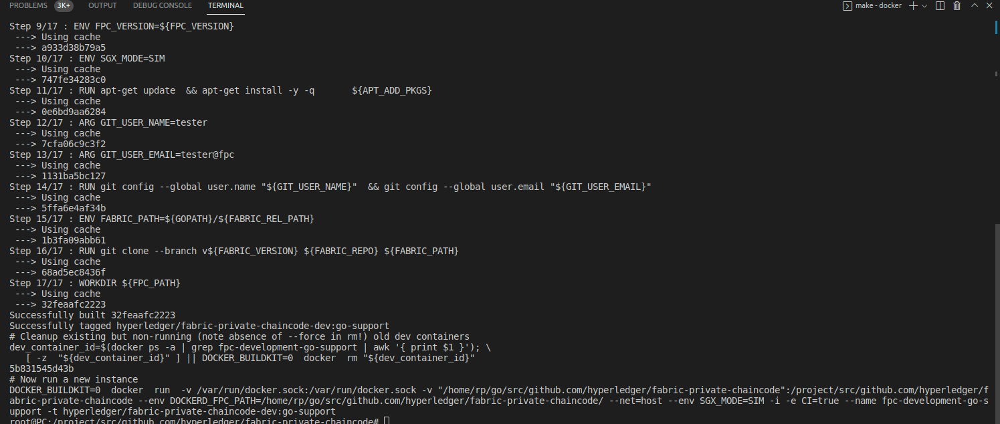

Once the Docker-development-environment is successful.

Then you can write the chaincode and build it using the "make" command.  
It is better to run the command "make", inside the docker-development-environment.

Do the modification in the make file.


In [ ]:
assetChaincode, _ := contractapi.NewChaincode(&chaincode.SmartContract{})

chaincode := fpc.NewPrivateChaincode(assetChaincode)

Make sure you import the followings in the main.go file
1. contract-api-go
2. ecc_go/chaincode
3. The chaincode location: github.com/hyperledger/fabric-private-chaincode/samples/demos/hlgf22/chaincode/smartcontract.go

In [ ]:
"github.com/hyperledger/fabric-contract-api-go/contractapi"
fpc "github.com/hyperledger/fabric-private-chaincode/ecc_go/chaincode"
"github.com/hyperledger/fabric-private-chaincode/samples/demos/hlgf22/chaincode"

Inside the hlgf22 folder create a folder "chaincode" and inside this folder put the "smartcontract.go".
You can get the smartcontract from the link: https://github.com/singhravipratap/SLA/blob/0f834cb43c2ad716b863be0ddaaf6e0ccaf0e7b3/chaincode/smartcontract.go

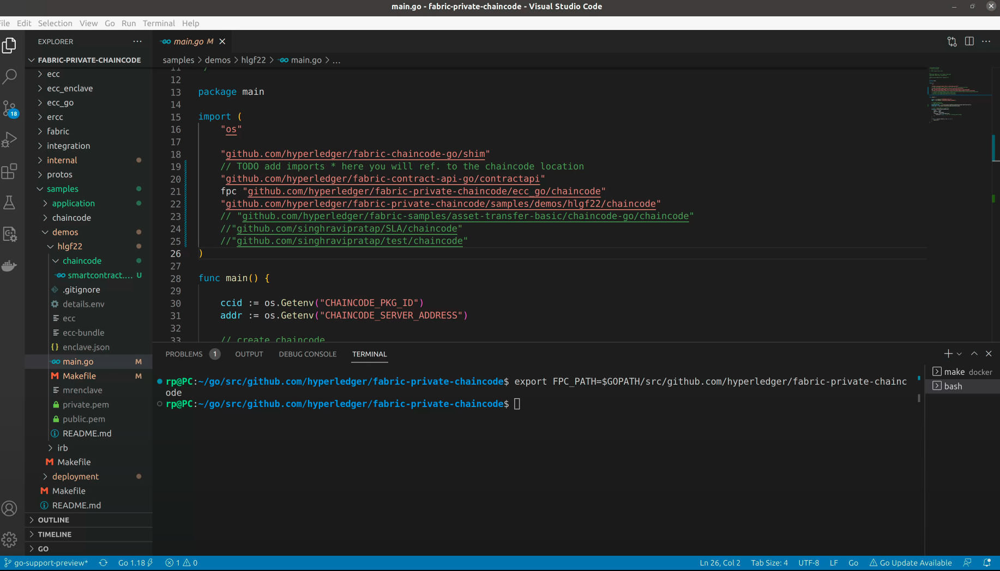

Edit the makefile with chaincode name.

In [ ]:
CC_NAME ?= fpc-sla 

Then run the following command from the makefile location 
i.e. fabric-private-chaincode/samples/demos/hlgf22#

In [ ]:
go mod tidy
make

Once it is successful, it will return the following:

1. A docker image: fpc-sla:go-support
2. Environment variable: details.env

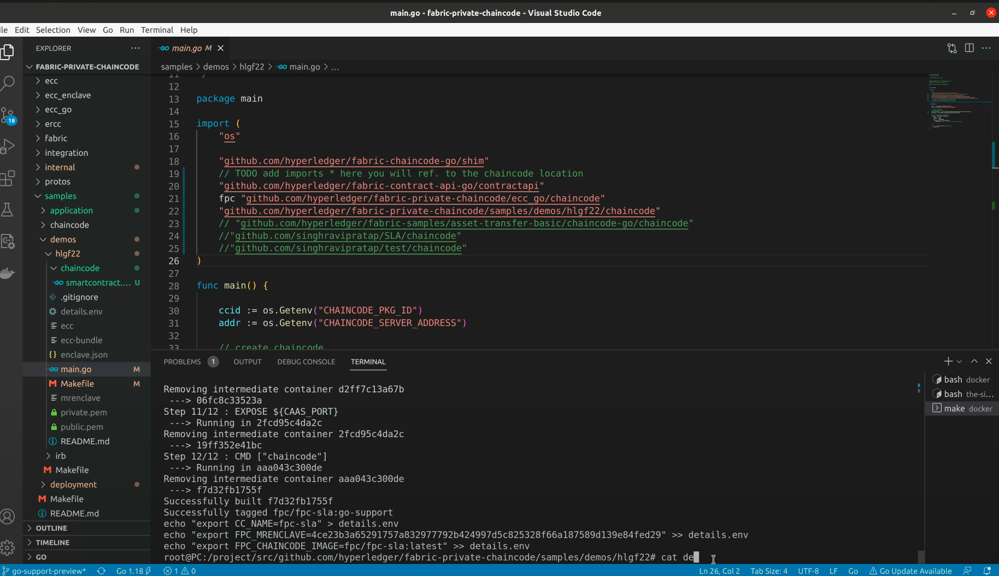

Part I is ready and now moving to part II for the network initiation.

## PART - II  (to be done in a seperate terminal)

Here we use the the fabric-smart-client as a Fabric network with two organizations.

Open a new terminal and set the FPC_PATH by:



In [ ]:
export FPC_PATH=$GOPATH/src/github.com/hyperledger/fabric-private-chaincode

To run the Fabric smart client network, we need the Fabric binaries (Fabric 2.3.3).
 
 Use the following commands:

In [ ]:
make -C $FPC_PATH/fabric
export FAB_BINS=$FPC_PATH/fabric/_internal/bin

then go to the following directory

In [ ]:
$FPC_PATH/samples/deployment/fabric-smart-client/the-simple-testing-network

Review the topology.go, where a simple Fabric network with two organizations is defined. 

Then source the following:

In [ ]:
source $FPC_PATH/samples/demos/hlgf22/details.env

and run the network by the following command:

In [ ]:
make run
// OR
go run . network start --path ./testdata

The fabric smart client network will start and you will see the start message

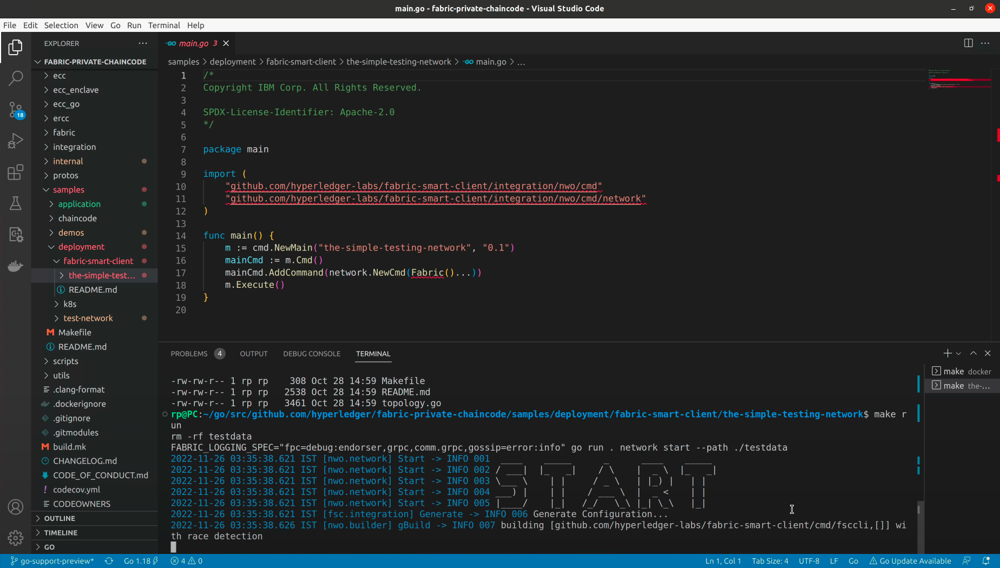 

It will do the chaincode packaging, installation, approval etc. and at the last, you will see the END message.

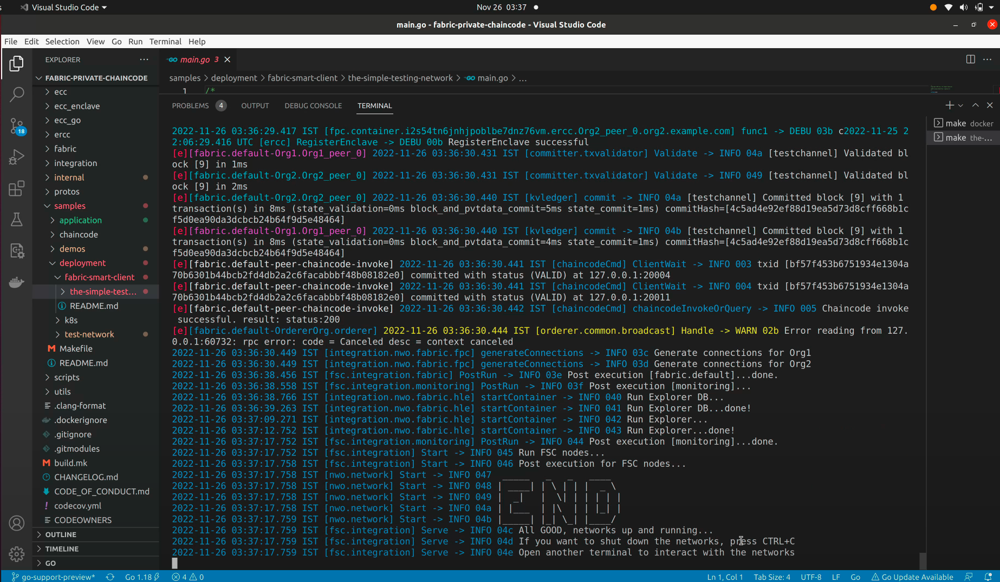

It also starts with the hyperledger explorer to see the network, related artifacts, and transaction information over the GUI.

## Hyperledger-explorer

Once the network started, we can open Hyperledger Explorer in a browser with the following address: http://localhost:8080

In the login and password box type admin. 

Then it will show the dashboard, network, block information, transaction, chaincode, and channels information.

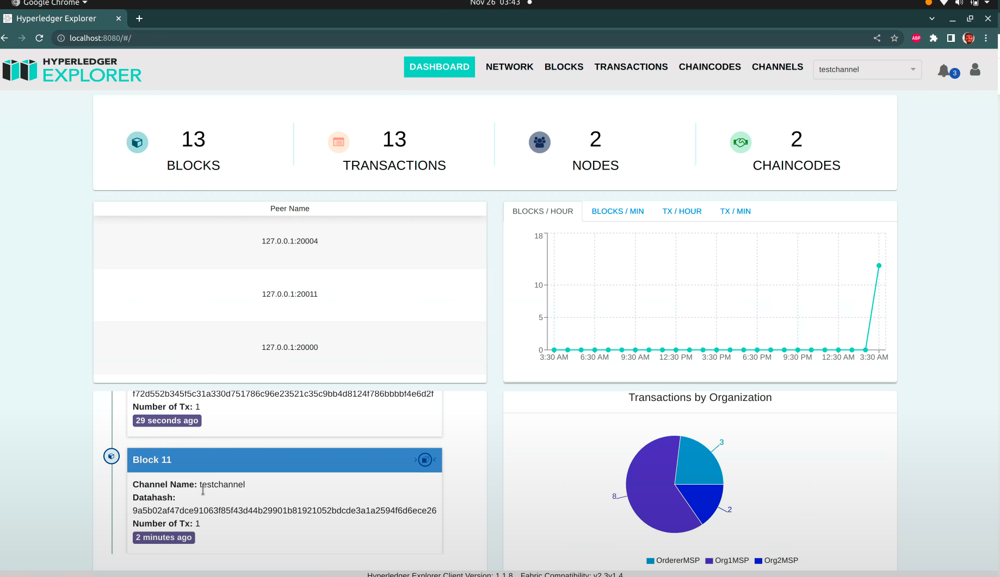

For the next steps, use a new terminal.

## PART - III  (to be done in a seperate terminal) 

We will interact with the deployed FPC network/chaincode using the simple-cli-go.

Open a new terminal and set the FPC_PATH by following:

In [ ]:
export FPC_PATH=$GOPATH/src/github.com/hyperledger/fabric-private-chaincode

then go to the simple-cli-go directory

In [ ]:
cd $FPC_PATH/samples/application/simple-cli-go

from there run the following:

In [ ]:
make

Once it is successful, then configure the CLI environment using the followings commands:

In [ ]:
source $FPC_PATH/samples/demos/hlgf22/details.env
$FPC_PATH/samples/deployment/fabric-smart-client/the-simple-testing-network/env.sh Org1

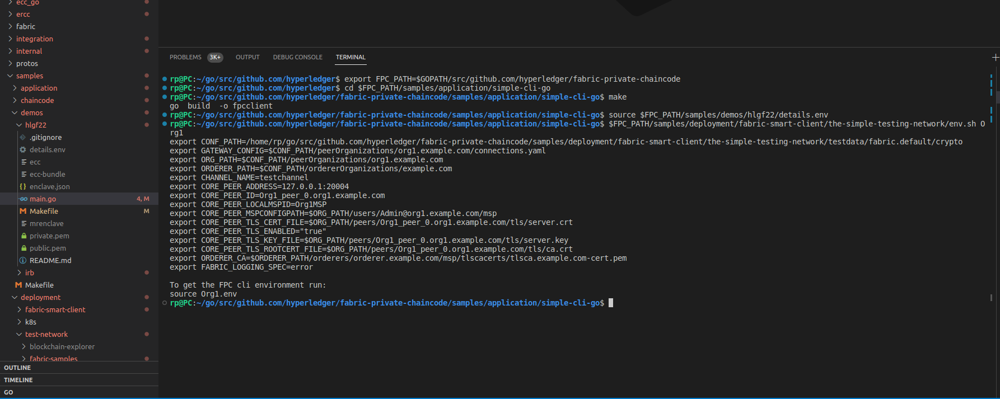

To invoke a predefined asset transaction, use the following command:

In [ ]:
./fpcclient invoke InitContract

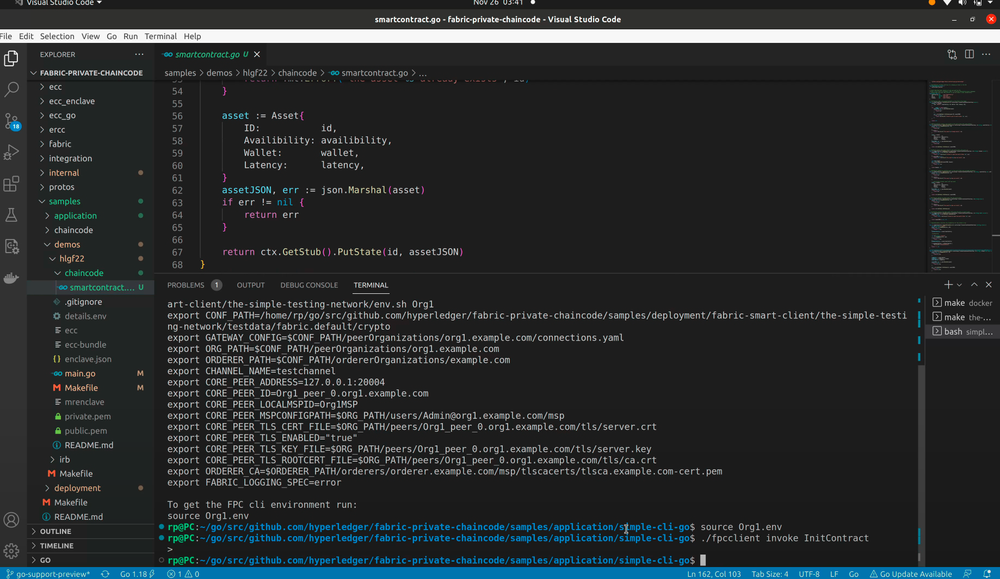

To read external data, query, computeParameters method can be executed from Org1 or Org2.

To perform a query transaction use the following command:

In [ ]:
./fpcclient query readAsset asset1

It will show in the CLI terminal window

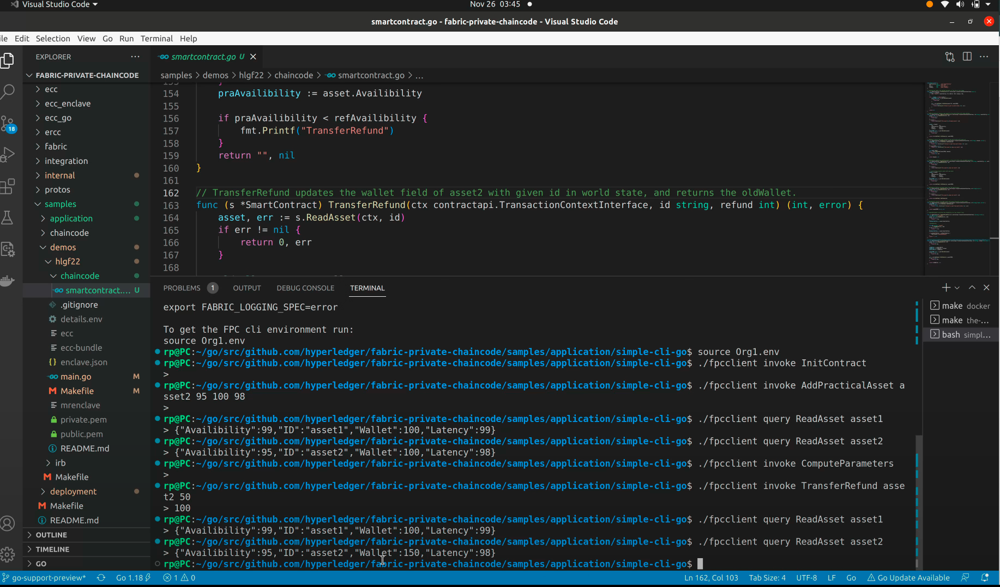

We can verify the transaction on the transaction tab on the hyperledger explorer GUI page.

To access Org2, open another terminal and set the environment variables for the Org2 using the following commands:

In [ ]:
source $FPC_PATH/samples/demos/hlgf22/details.env
$FPC_PATH/samples/deployment/fabric-smart-client/the-simple-testing-network/env.sh Org2

In the hyperledger explorer, look into the transaction. If you look inside a particular transaction then you can also see that the FPC hides the transaction data( we do not want values to be read). Write values show the alphanumeric-symboles,and that is not human readable.

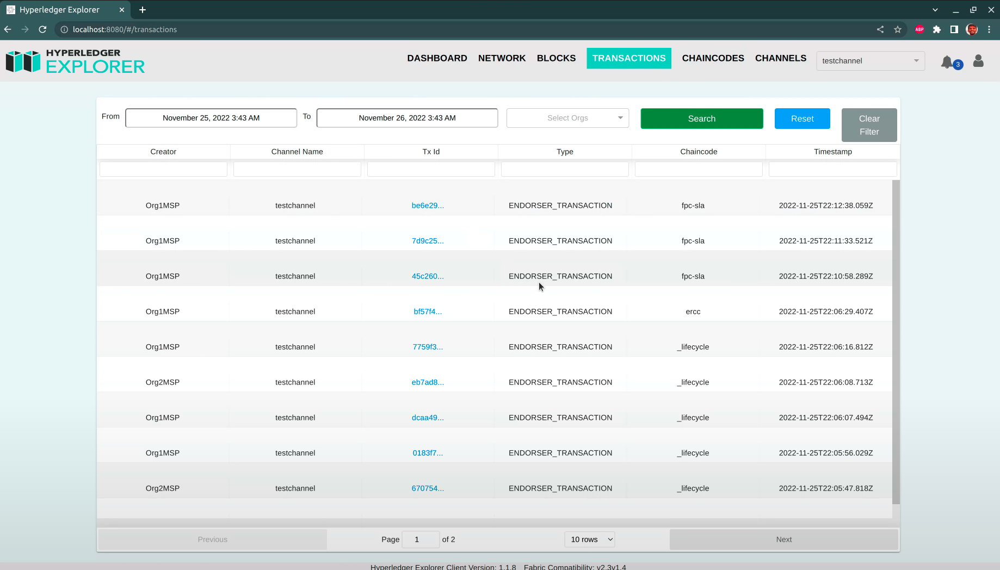

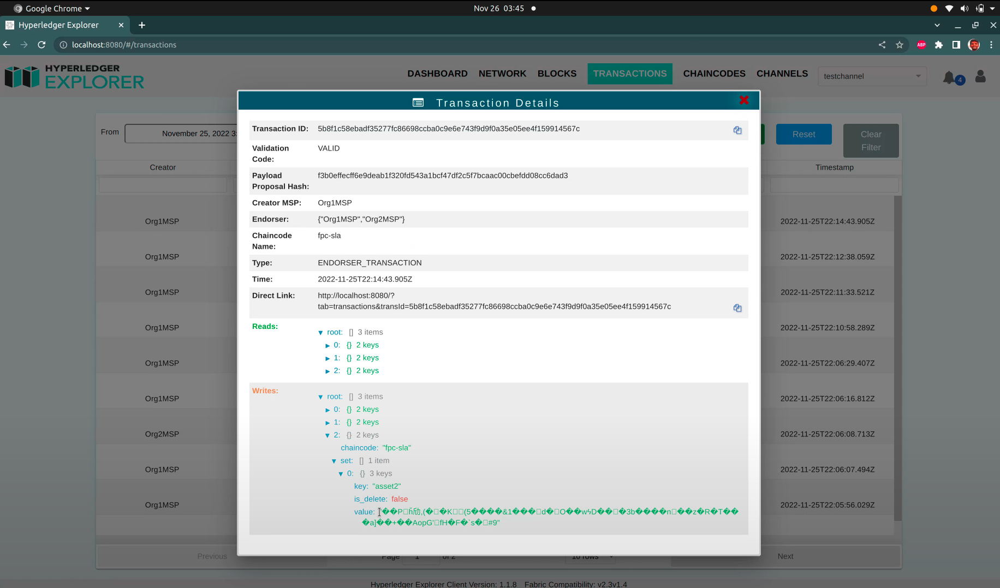

Thank you.